In [0]:
import os, time
import torch
import pandas as pd
from skimage import io, transform
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import cv2

In [4]:
!unzip data.zip
%clear

Archive:  data.zip
replace data/0/0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [7]:
dataset_path = "./data"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [0]:
class PianorollDataset(Dataset):
    def __init__(self, folder_path):
        self.folder = folder_path
        self.oswalk = list(os.walk(dataset_path))[1:] #throw away the first one - the root directory
        self.dataset = []
        print("Dataset: Building metadata")
        start = time.time()
        for root,_,files in self.oswalk:
            t = len(files) - 3 # there is always a midi-file itself in the directory, so -1, 
            # also since we're pairing the files - there will be N-1 pairs, so -1 again
            # also, let's throw away the last part which is mostly empty, so -1 again
            self.dataset += [(os.path.join(root, f"{i}.png"),
                         os.path.join(root, f"{i+1}.png")) for i in range(t)]
        print(f"Dataset: Built in {np.round(time.time()-start,3)} sec")
        
    def __getitem__(self, idx):
        first, second = self.dataset[idx]
        return torch.unsqueeze(torch.Tensor(io.imread(first)/255),0), torch.unsqueeze(torch.Tensor(io.imread(second)/255),0)
    
    def __len__(self):
        return len(self.dataset)
    

In [0]:
class CoNNVAEr(nn.Module):
    def __init__(self):
        super(CoNNVAEr,self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=7, stride=2),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=3,stride=2),
            nn.Conv2d(64, 128, kernel_size=5, stride=2),
            nn.LeakyReLU(),
            nn.MaxPool2d(kernel_size=3,stride=2),
            nn.Conv2d(128, 256, kernel_size=3, stride=2)
            #nn.Flatten()
        )
        #self.fc_mu = nn.Linear(256,128)
        #self.fc_s = nn.Linear(256,128)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size=5, stride=2),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=(4,1), stride=2),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2)
        )
    
    def reparameterize(self, mu, s):
        std = s.mul(0.5).exp_()
        esp = torch.randn(*mu.size())
        z = mu + std * esp
        return z
    
    def forward(self, x):
        t = self.encoder(x)
        #mu, s = self.fc_mu(t), self.fc_s(t)
        #z = self.reparameterize(mu,s)
        #z = z.view(x.size(0), 128, 1, 1)
        z = self.decoder(t)
        return z#, mu, s

In [82]:
dataset = PianorollDataset(dataset_path)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, pin_memory=True, drop_last=True)
net = CoNNVAEr()
adam = torch.optim.Adam(net.parameters(),lr=0.005)
lossfn = nn.MSELoss()
epochs = 5
print(f"{len(dataloader)} batches prepared")

Dataset: Building metadata
Dataset: Built in 0.045 sec
1237 batches prepared


Epoch 0/5:0/1237 loss = 3.026257;


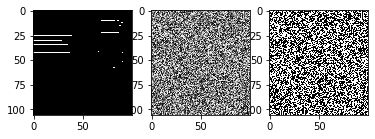

Epoch 0/5:20/1237 loss = 2.205225;


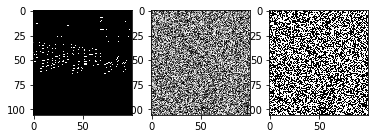

Epoch 0/5:40/1237 loss = 2.448862;


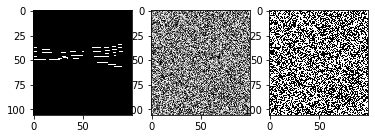

Epoch 0/5:60/1237 loss = 2.253466;


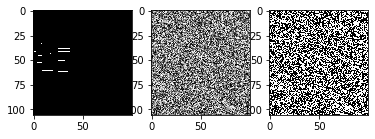

Epoch 0/5:80/1237 loss = 1.945822;


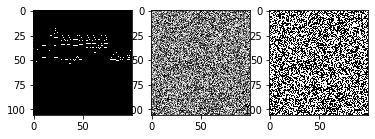

Epoch 0/5:100/1237 loss = 7.725627;


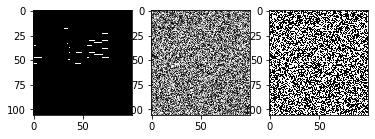

Epoch 0/5:120/1237 loss = 3.261902;


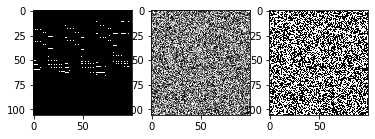

Epoch 0/5:140/1237 loss = 2.998999;


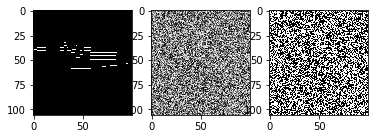

Epoch 0/5:160/1237 loss = 2.026258;


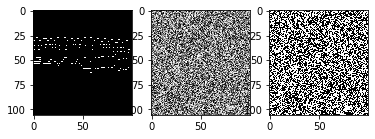

Epoch 0/5:180/1237 loss = 2.369864;


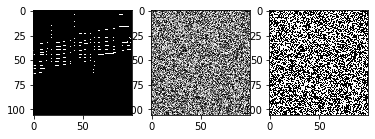

Epoch 0/5:200/1237 loss = 2.500322;


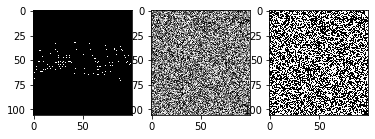

Epoch 0/5:220/1237 loss = 3.371581;


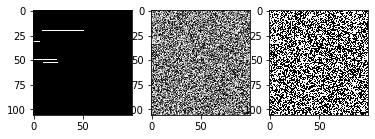

Epoch 0/5:240/1237 loss = 2.304899;


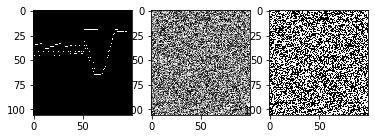

Epoch 0/5:260/1237 loss = 1.694096;


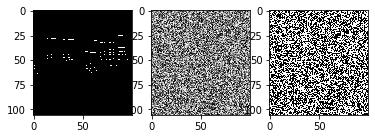

Epoch 0/5:280/1237 loss = 2.578823;


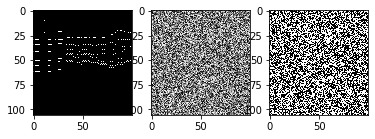

Epoch 0/5:300/1237 loss = 2.589962;


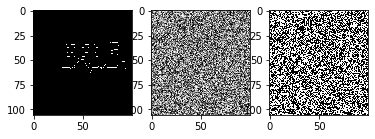

Epoch 0/5:320/1237 loss = 4.351243;


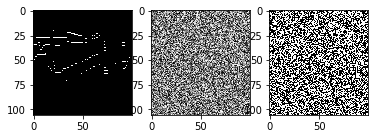

Epoch 0/5:340/1237 loss = 3.260371;


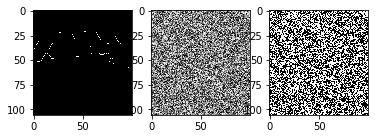

Epoch 0/5:360/1237 loss = 2.742151;


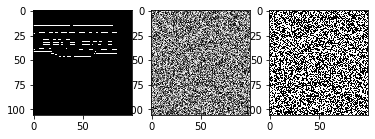

Epoch 0/5:380/1237 loss = 2.607883;


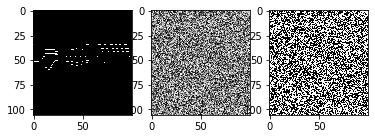

Epoch 0/5:400/1237 loss = 2.32372;


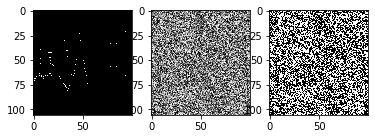

Epoch 0/5:420/1237 loss = 2.874945;


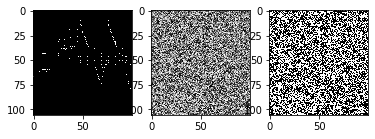

Epoch 0/5:440/1237 loss = 2.473947;


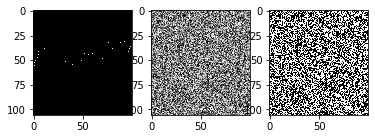

Epoch 0/5:460/1237 loss = 1.921534;


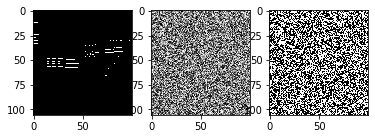

Epoch 0/5:480/1237 loss = 2.102064;


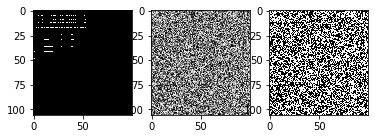

Epoch 0/5:500/1237 loss = 2.489459;


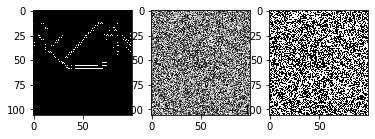

Epoch 0/5:520/1237 loss = 2.29638;


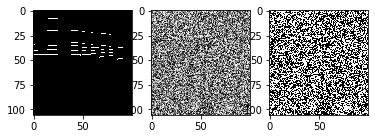

Epoch 0/5:540/1237 loss = 2.496934;


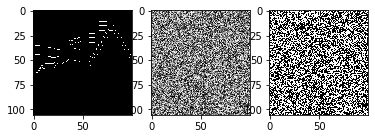

Epoch 0/5:560/1237 loss = 1.814644;


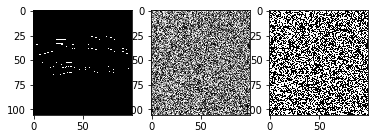

Epoch 0/5:580/1237 loss = 2.19383;


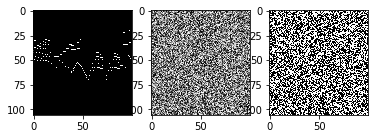

Epoch 0/5:600/1237 loss = 2.283669;


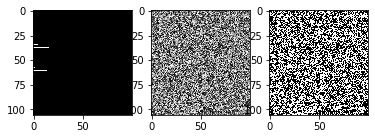

Epoch 0/5:620/1237 loss = 2.068402;


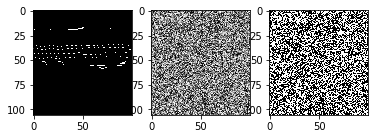

Epoch 0/5:640/1237 loss = 2.388275;


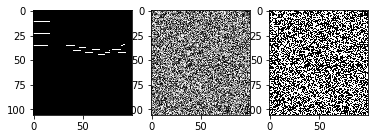

Epoch 0/5:660/1237 loss = 2.075649;


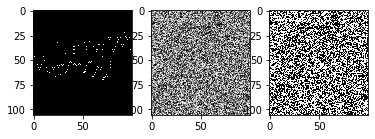

Epoch 0/5:680/1237 loss = 1.921638;


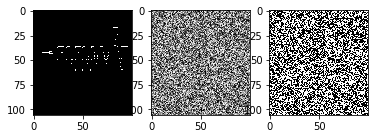

Epoch 0/5:700/1237 loss = 1.808549;


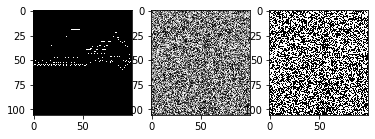

Epoch 0/5:720/1237 loss = 1.992852;


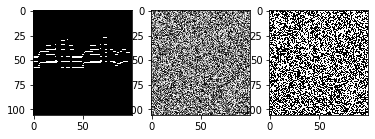

Epoch 0/5:740/1237 loss = 2.173867;


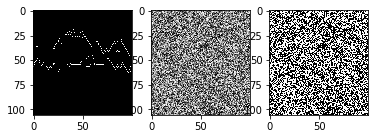

Epoch 0/5:760/1237 loss = 1.528072;


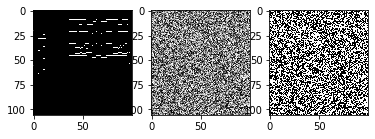

Epoch 0/5:780/1237 loss = 1.824358;


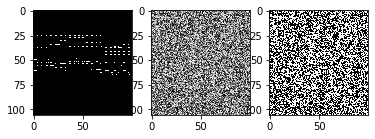

Epoch 0/5:800/1237 loss = 1.884934;


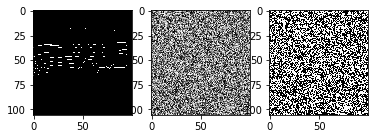

Epoch 0/5:820/1237 loss = 1.712206;


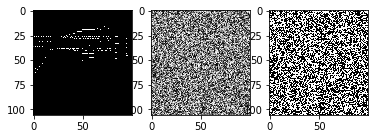

Epoch 0/5:840/1237 loss = 1.585385;


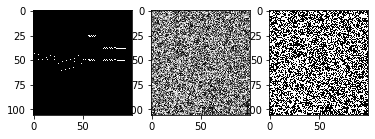

Epoch 0/5:860/1237 loss = 2.00779;


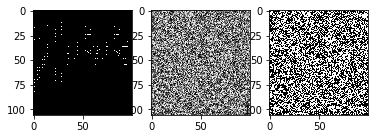

Epoch 0/5:880/1237 loss = 2.231418;


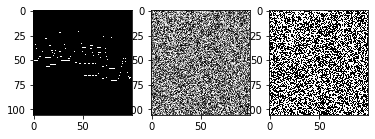

Epoch 0/5:900/1237 loss = 1.784548;


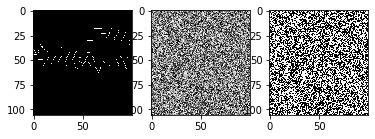

Epoch 0/5:920/1237 loss = 2.099664;


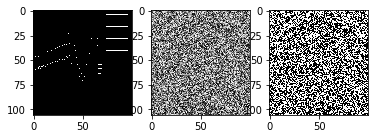

Epoch 0/5:940/1237 loss = 1.694735;


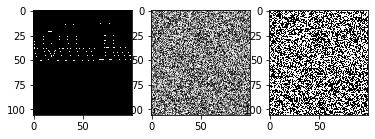

Epoch 0/5:960/1237 loss = 1.872775;


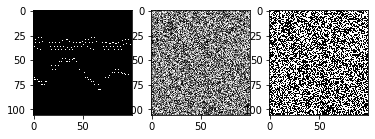

Epoch 0/5:980/1237 loss = 1.511422;


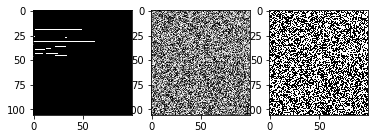

Epoch 0/5:1000/1237 loss = 1.905981;


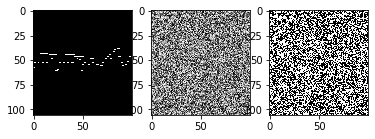

Epoch 0/5:1020/1237 loss = 1.686296;


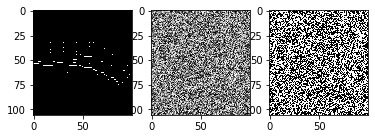

Epoch 0/5:1040/1237 loss = 1.635862;


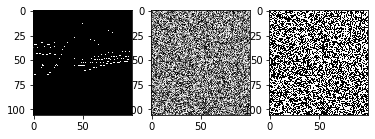

Epoch 0/5:1060/1237 loss = 1.504794;


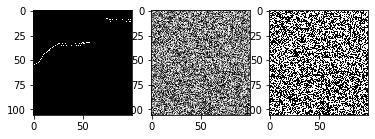

Epoch 0/5:1080/1237 loss = 1.538011;


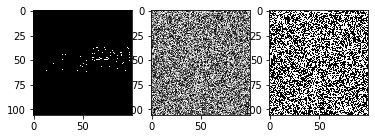

Epoch 0/5:1100/1237 loss = 1.573048;


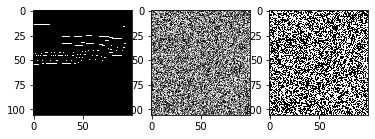

Epoch 0/5:1120/1237 loss = 1.222104;


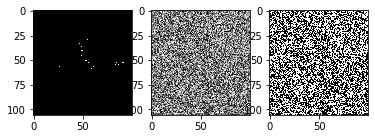

Epoch 0/5:1140/1237 loss = 1.15168;


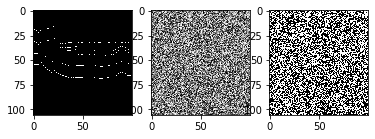

Epoch 0/5:1160/1237 loss = 1.645095;


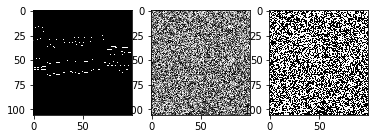

Epoch 0/5:1180/1237 loss = 1.818332;


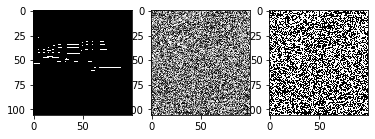

Epoch 0/5:1200/1237 loss = 1.631588;


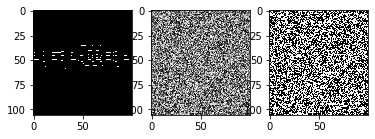

Epoch 0/5:1220/1237 loss = 1.432503;


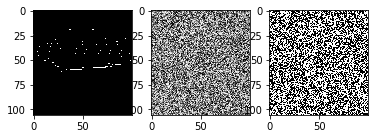

Epoch 1/5:0/1237 loss = 1.895577;


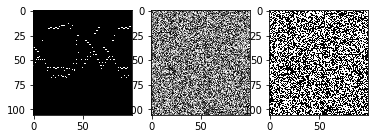

Epoch 1/5:20/1237 loss = 1.218551;


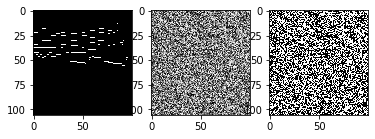

Epoch 1/5:40/1237 loss = 1.310459;


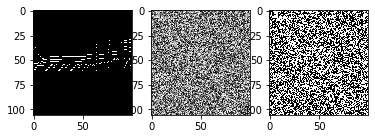

Epoch 1/5:60/1237 loss = 1.329067;


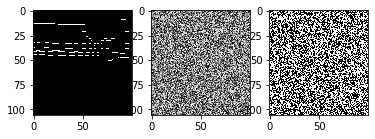

Epoch 1/5:80/1237 loss = 1.477441;


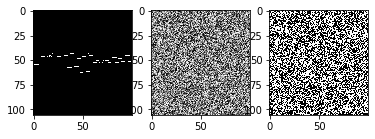

Epoch 1/5:100/1237 loss = 1.193865;


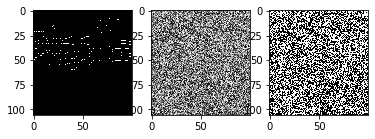

Epoch 1/5:120/1237 loss = 1.417784;


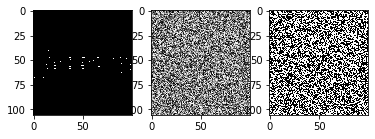

Epoch 1/5:140/1237 loss = 1.348839;


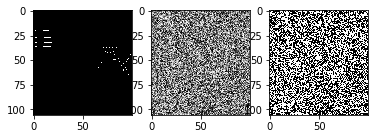

Epoch 1/5:160/1237 loss = 1.19538;


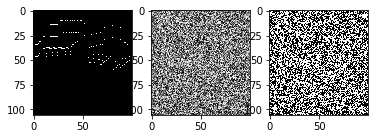

Epoch 1/5:180/1237 loss = 1.261047;


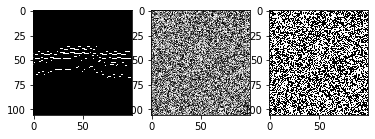

Epoch 1/5:200/1237 loss = 1.195672;


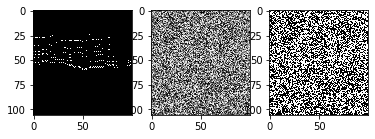

Epoch 1/5:220/1237 loss = 1.189498;


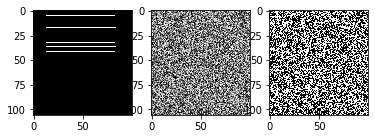

Epoch 1/5:240/1237 loss = 1.353712;


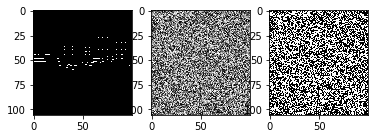

Epoch 1/5:260/1237 loss = 1.450311;


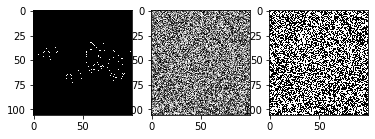

Epoch 1/5:280/1237 loss = 1.686159;


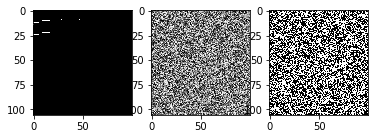

Epoch 1/5:300/1237 loss = 1.367339;


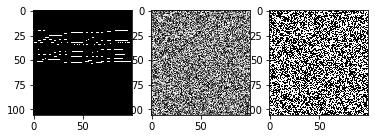

Epoch 1/5:320/1237 loss = 1.204221;


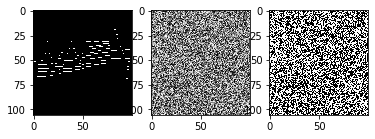

Epoch 1/5:340/1237 loss = 1.190965;


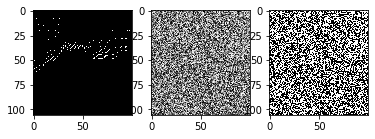

Epoch 1/5:360/1237 loss = 1.071546;


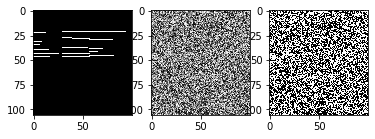

Epoch 1/5:380/1237 loss = 1.061747;


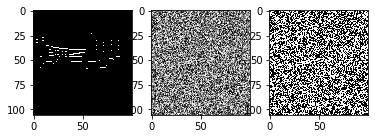

Epoch 1/5:400/1237 loss = 1.071211;


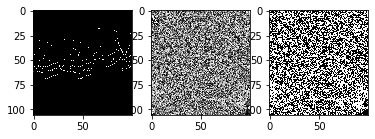

Epoch 1/5:420/1237 loss = 1.321629;


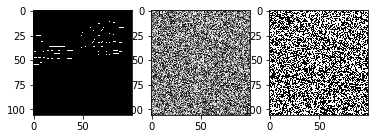

Epoch 1/5:440/1237 loss = 0.852583;


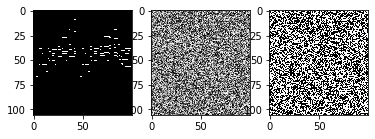

Epoch 1/5:460/1237 loss = 1.223346;


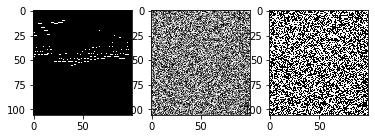

Epoch 1/5:480/1237 loss = 1.136787;


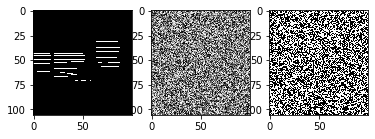

Epoch 1/5:500/1237 loss = 1.266673;


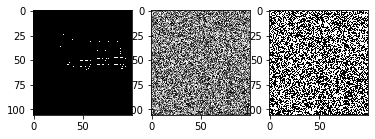

Epoch 1/5:520/1237 loss = 0.932285;


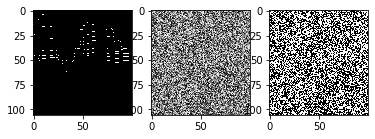

Epoch 1/5:540/1237 loss = 1.205852;


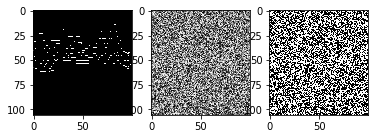

Epoch 1/5:560/1237 loss = 1.003592;


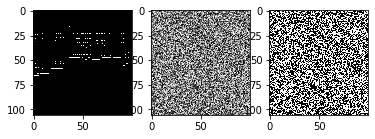

Epoch 1/5:580/1237 loss = 1.214507;


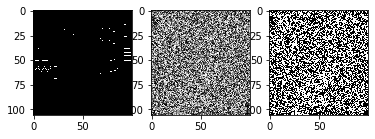

Epoch 1/5:600/1237 loss = 0.978139;


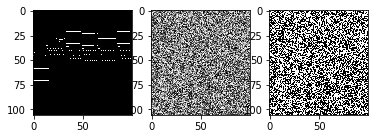

Epoch 1/5:620/1237 loss = 1.071909;


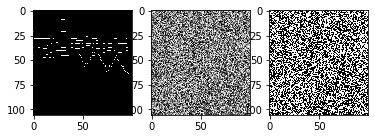

Epoch 1/5:640/1237 loss = 1.394922;


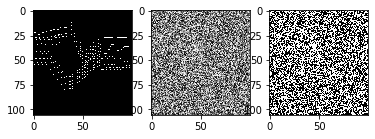

Epoch 1/5:660/1237 loss = 1.258218;


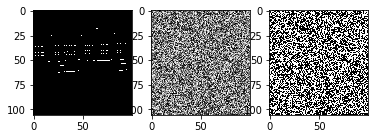

Epoch 1/5:680/1237 loss = 0.998796;


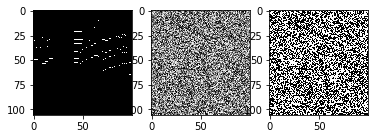

Epoch 1/5:700/1237 loss = 1.074722;


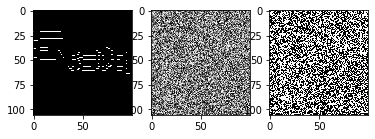

Epoch 1/5:720/1237 loss = 1.274213;


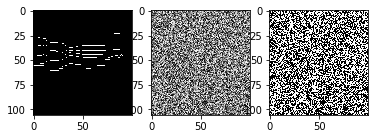

Epoch 1/5:740/1237 loss = 1.209307;


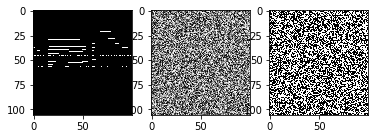

Epoch 1/5:760/1237 loss = 0.85819;


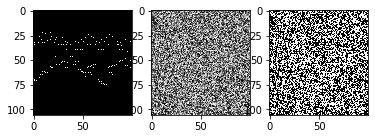

Epoch 1/5:780/1237 loss = 1.004494;


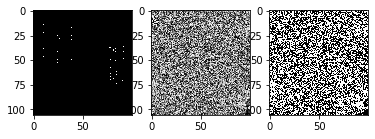

Epoch 1/5:800/1237 loss = 0.740344;


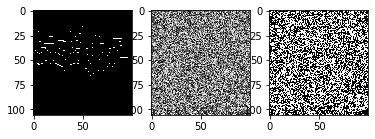

Epoch 1/5:820/1237 loss = 0.814839;


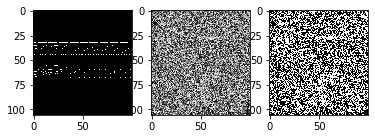

Epoch 1/5:840/1237 loss = 1.194537;


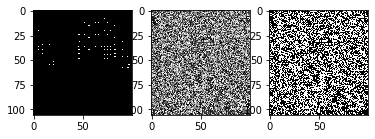

Epoch 1/5:860/1237 loss = 0.861557;


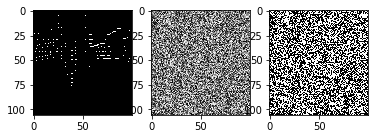

Epoch 1/5:880/1237 loss = 0.983351;


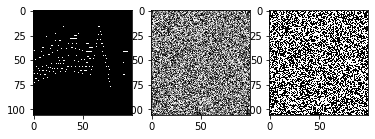

Epoch 1/5:900/1237 loss = 1.04105;


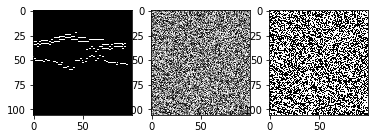

Epoch 1/5:920/1237 loss = 1.224441;


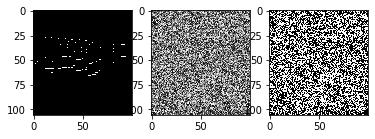

Epoch 1/5:940/1237 loss = 1.163835;


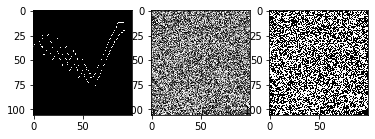

Epoch 1/5:960/1237 loss = 0.908445;


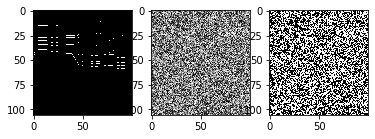

Epoch 1/5:980/1237 loss = 0.965873;


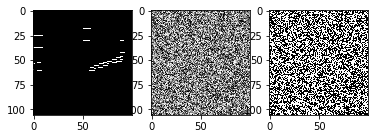

Epoch 1/5:1000/1237 loss = 1.027264;


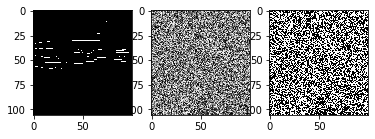

Epoch 1/5:1020/1237 loss = 0.878043;


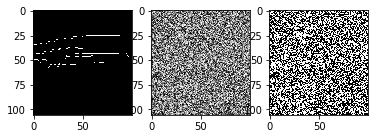

Epoch 1/5:1040/1237 loss = 0.819462;


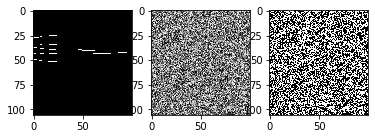

Epoch 1/5:1060/1237 loss = 0.755794;


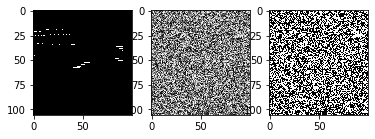

Epoch 1/5:1080/1237 loss = 0.774318;


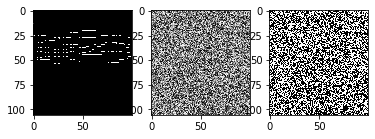

Epoch 1/5:1100/1237 loss = 0.841754;


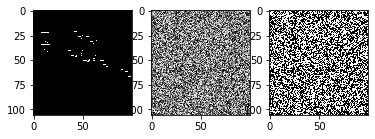

Epoch 1/5:1120/1237 loss = 0.868127;


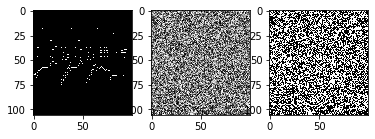

Epoch 1/5:1140/1237 loss = 1.063093;


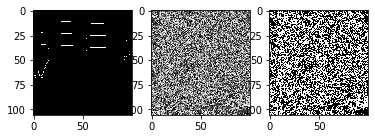

Epoch 1/5:1160/1237 loss = 0.917973;


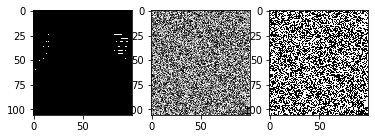

Epoch 1/5:1180/1237 loss = 0.835629;


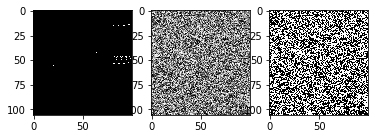

Epoch 1/5:1200/1237 loss = 0.979688;


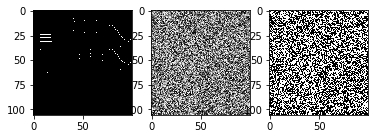

Epoch 1/5:1220/1237 loss = 0.928964;


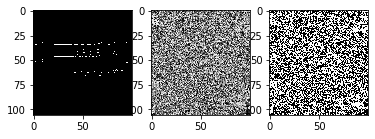

Epoch 2/5:0/1237 loss = 0.703496;


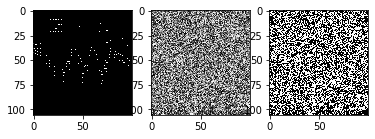

Epoch 2/5:20/1237 loss = 0.635349;


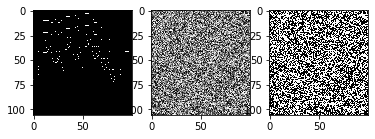

Epoch 2/5:40/1237 loss = 0.903188;


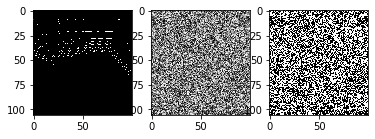

Epoch 2/5:60/1237 loss = 0.902861;


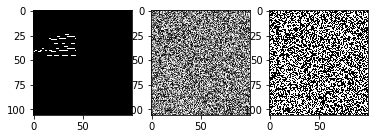

Epoch 2/5:80/1237 loss = 0.855341;


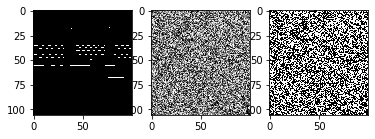

Epoch 2/5:100/1237 loss = 1.374507;


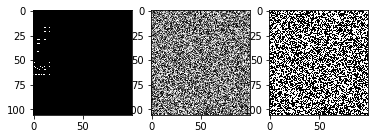

Epoch 2/5:120/1237 loss = 0.706776;


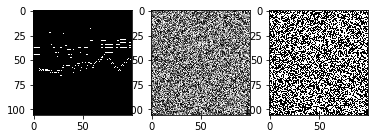

Epoch 2/5:140/1237 loss = 0.713132;


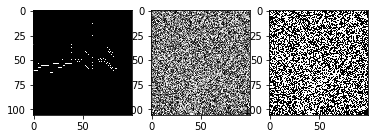

Epoch 2/5:160/1237 loss = 0.929906;


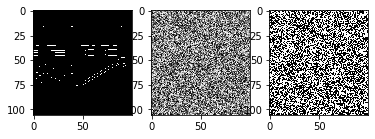

Epoch 2/5:180/1237 loss = 0.786713;


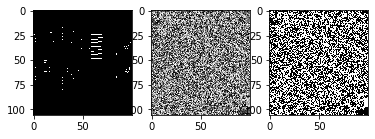

Epoch 2/5:200/1237 loss = 0.743324;


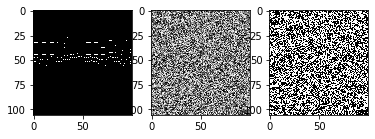

Epoch 2/5:220/1237 loss = 0.738097;


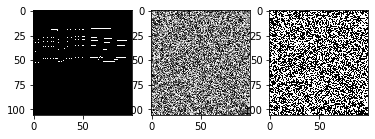

Epoch 2/5:240/1237 loss = 0.900354;


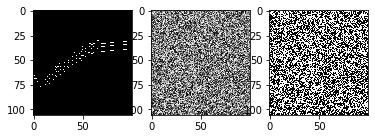

Epoch 2/5:260/1237 loss = 0.778247;


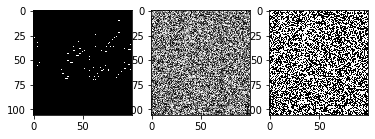

Epoch 2/5:280/1237 loss = 0.608813;


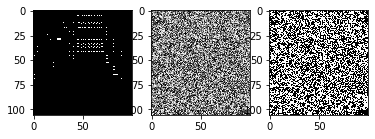

Epoch 2/5:300/1237 loss = 0.890661;


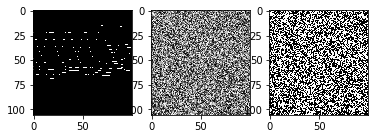

Epoch 2/5:320/1237 loss = 0.72897;


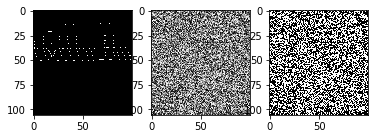

Epoch 2/5:340/1237 loss = 0.975678;


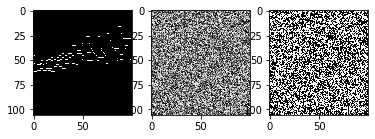

Epoch 2/5:360/1237 loss = 0.713044;


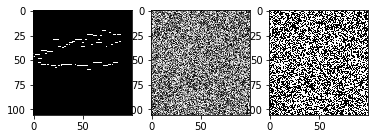

Epoch 2/5:380/1237 loss = 0.664004;


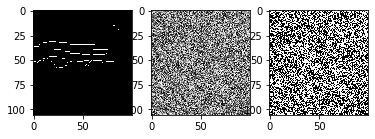

Epoch 2/5:400/1237 loss = 0.821237;


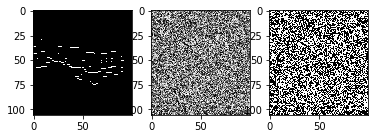

Epoch 2/5:420/1237 loss = 0.683081;


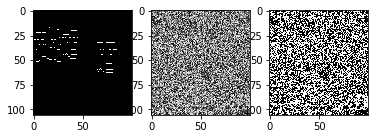

Epoch 2/5:440/1237 loss = 0.725855;


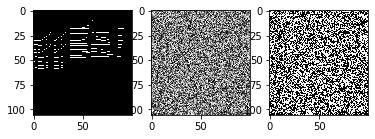

Epoch 2/5:460/1237 loss = 0.871444;


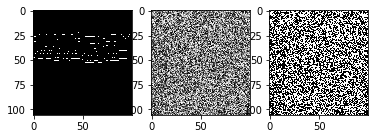

Epoch 2/5:480/1237 loss = 0.655708;


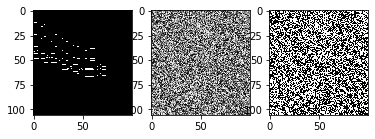

Epoch 2/5:500/1237 loss = 0.719364;


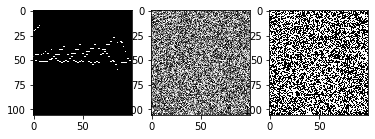

Epoch 2/5:520/1237 loss = 1.647424;


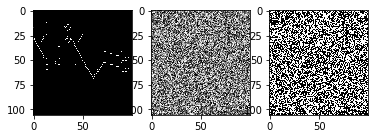

Epoch 2/5:540/1237 loss = 0.925041;


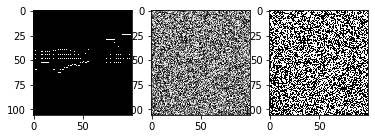

Epoch 2/5:560/1237 loss = 0.575158;


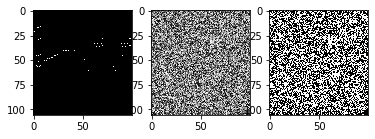

Epoch 2/5:580/1237 loss = 0.972705;


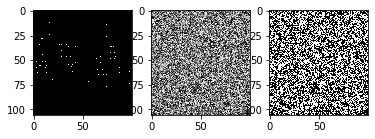

Epoch 2/5:600/1237 loss = 0.623683;


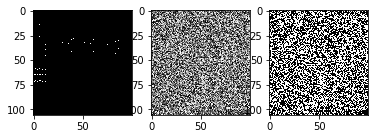

Epoch 2/5:620/1237 loss = 0.648399;


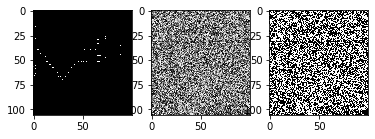

Epoch 2/5:640/1237 loss = 0.540354;


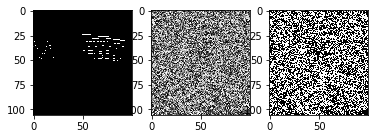

Epoch 2/5:660/1237 loss = 0.562601;


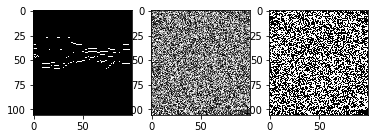

Epoch 2/5:680/1237 loss = 0.554638;


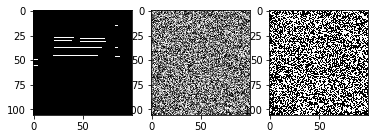

Epoch 2/5:700/1237 loss = 0.609237;


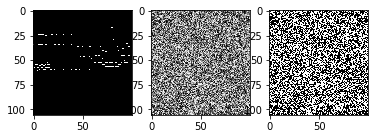

Epoch 2/5:720/1237 loss = 0.511281;


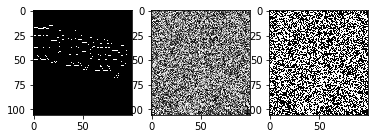

Epoch 2/5:740/1237 loss = 0.528934;


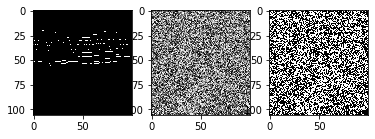

Epoch 2/5:760/1237 loss = 0.691172;


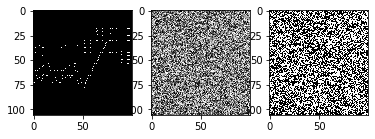

Epoch 2/5:780/1237 loss = 0.617939;


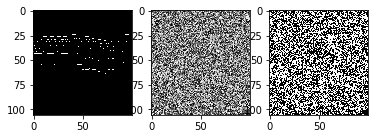

Epoch 2/5:800/1237 loss = 0.558336;


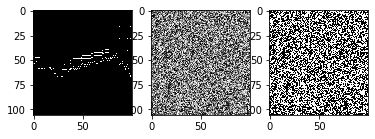

Epoch 2/5:820/1237 loss = 0.499888;


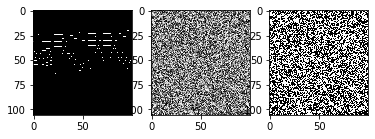

Epoch 2/5:840/1237 loss = 0.603979;


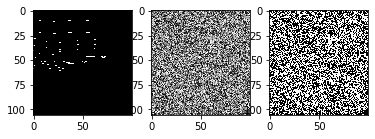

Epoch 2/5:860/1237 loss = 0.554591;


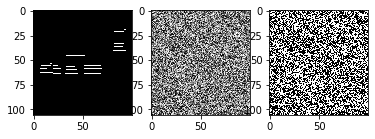

Epoch 2/5:880/1237 loss = 0.414253;


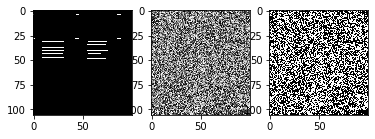

Epoch 2/5:900/1237 loss = 1.072331;


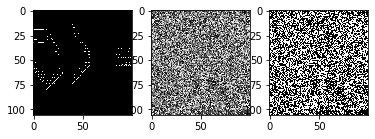

Epoch 2/5:920/1237 loss = 0.770376;


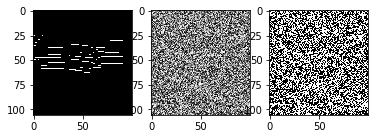

Epoch 2/5:940/1237 loss = 0.600366;


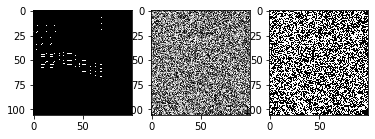

Epoch 2/5:960/1237 loss = 0.52546;


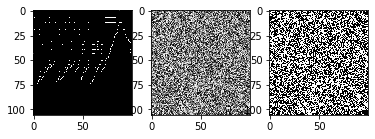

Epoch 2/5:980/1237 loss = 0.505459;


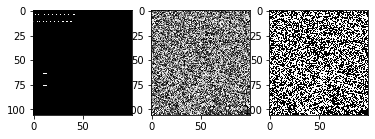

Epoch 2/5:1000/1237 loss = 0.471352;


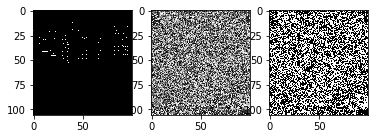

Epoch 2/5:1020/1237 loss = 0.72217;


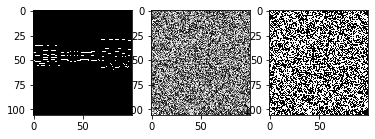

Epoch 2/5:1040/1237 loss = 0.579035;


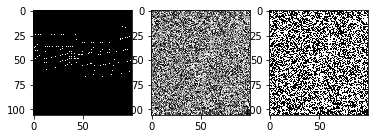

Epoch 2/5:1060/1237 loss = 0.453968;


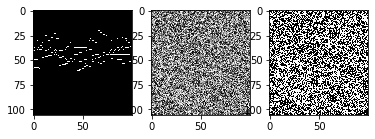

Epoch 2/5:1080/1237 loss = 1.17877;


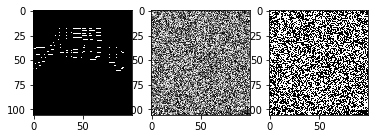

Epoch 2/5:1100/1237 loss = 0.450535;


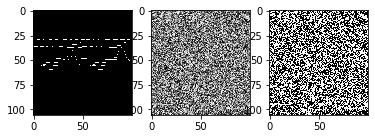

Epoch 2/5:1120/1237 loss = 0.341904;


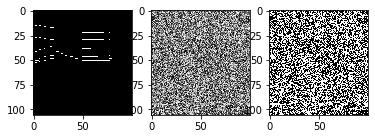

Epoch 2/5:1140/1237 loss = 0.504038;


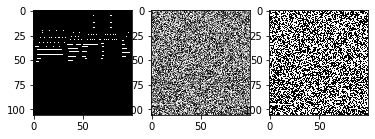

Epoch 2/5:1160/1237 loss = 0.396557;


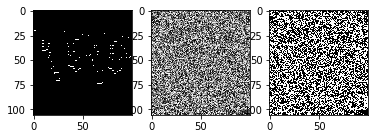

Epoch 2/5:1180/1237 loss = 0.523419;


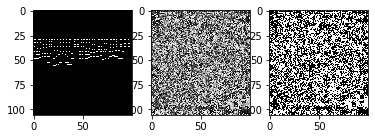

Epoch 2/5:1200/1237 loss = 0.57898;


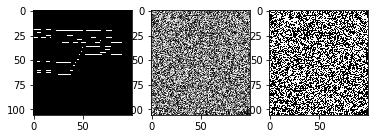

Epoch 2/5:1220/1237 loss = 0.436952;


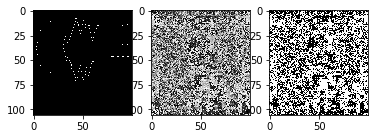

Epoch 3/5:0/1237 loss = 0.569313;


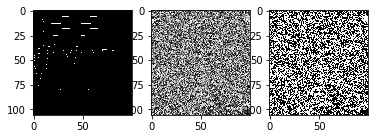

Epoch 3/5:20/1237 loss = 0.537315;


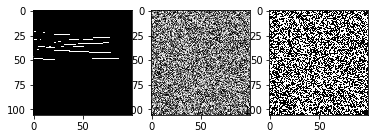

Epoch 3/5:40/1237 loss = 0.397085;


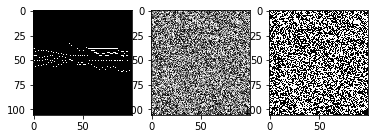

Epoch 3/5:60/1237 loss = 0.979296;


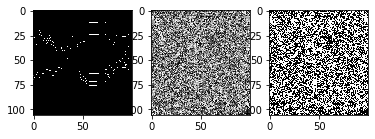

Epoch 3/5:80/1237 loss = 0.463567;


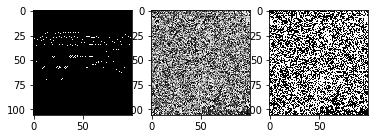

Epoch 3/5:100/1237 loss = 0.628254;


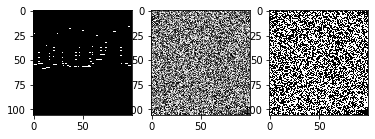

Epoch 3/5:120/1237 loss = 0.680799;


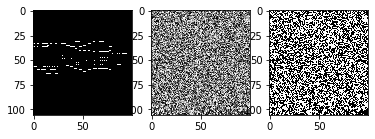

Epoch 3/5:140/1237 loss = 0.428266;


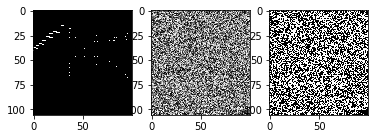

Epoch 3/5:160/1237 loss = 0.787276;


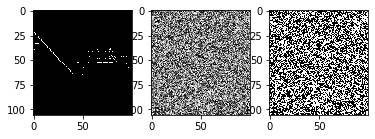

Epoch 3/5:180/1237 loss = 0.811134;


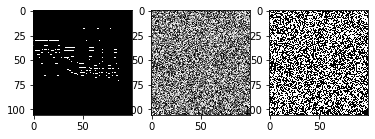

Epoch 3/5:200/1237 loss = 0.327539;


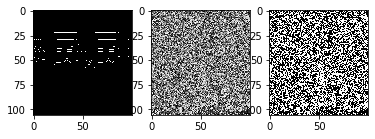

Epoch 3/5:220/1237 loss = 0.44959;


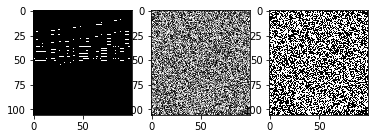

Epoch 3/5:240/1237 loss = 0.383412;


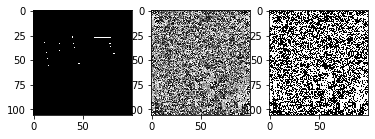

Epoch 3/5:260/1237 loss = 0.417831;


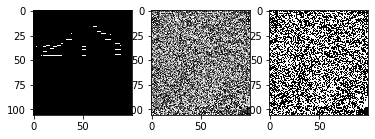

Epoch 3/5:280/1237 loss = 0.488275;


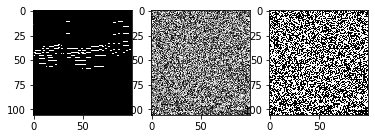

Epoch 3/5:300/1237 loss = 0.366542;


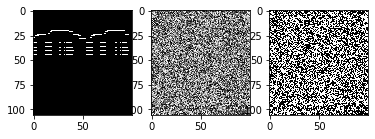

Epoch 3/5:320/1237 loss = 0.315105;


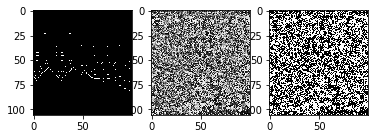

Epoch 3/5:340/1237 loss = 0.329859;


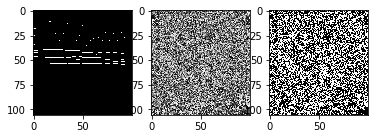

Epoch 3/5:360/1237 loss = 0.484794;


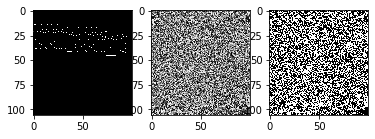

Epoch 3/5:380/1237 loss = 0.366309;


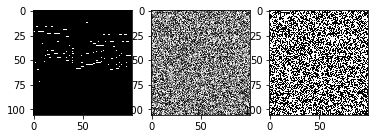

Epoch 3/5:400/1237 loss = 0.448702;


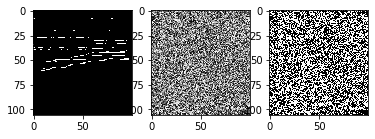

Epoch 3/5:420/1237 loss = 0.720554;


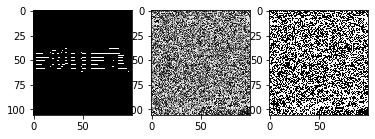

Epoch 3/5:440/1237 loss = 0.77513;


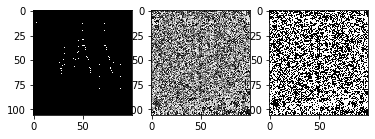

Epoch 3/5:460/1237 loss = 0.329401;


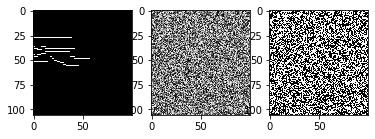

Epoch 3/5:480/1237 loss = 0.669651;


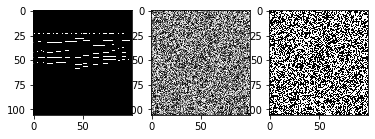

Epoch 3/5:500/1237 loss = 0.404053;


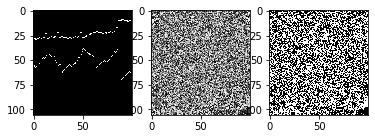

Epoch 3/5:520/1237 loss = 0.32236;


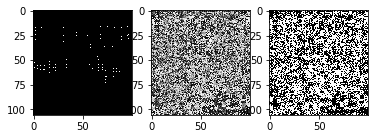

Epoch 3/5:540/1237 loss = 0.423231;


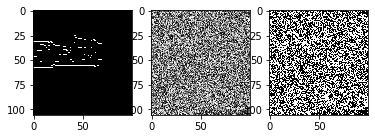

Epoch 3/5:560/1237 loss = 0.31332;


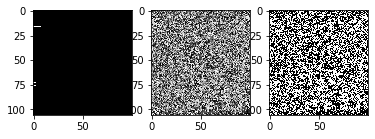

Epoch 3/5:580/1237 loss = 0.434646;


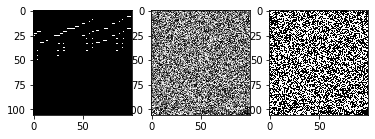

Epoch 3/5:600/1237 loss = 0.415107;


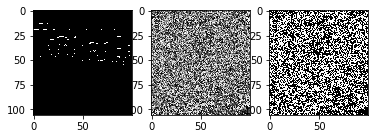

Epoch 3/5:620/1237 loss = 0.532568;


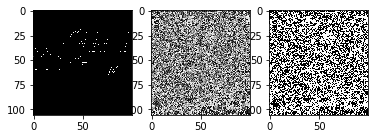

Epoch 3/5:640/1237 loss = 0.316074;


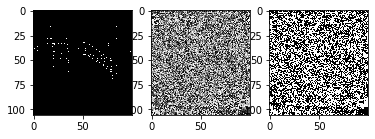

Epoch 3/5:660/1237 loss = 0.315284;


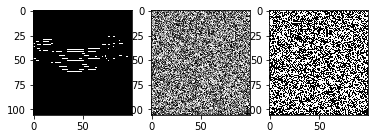

Epoch 3/5:680/1237 loss = 0.385055;


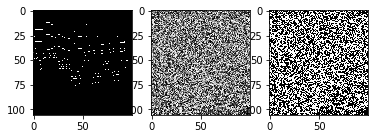

Epoch 3/5:700/1237 loss = 0.363096;


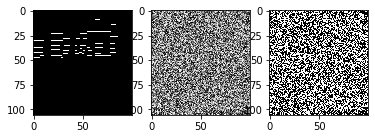

Epoch 3/5:720/1237 loss = 0.420688;


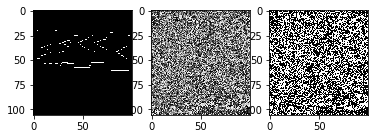

Epoch 3/5:740/1237 loss = 0.343199;


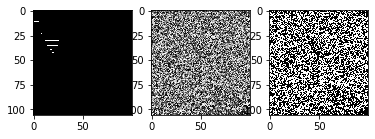

Epoch 3/5:760/1237 loss = 5.371995;


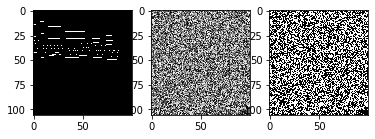

Epoch 3/5:780/1237 loss = 0.557663;


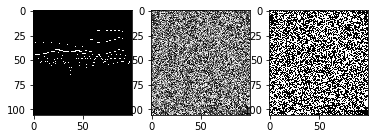

Epoch 3/5:800/1237 loss = 0.327587;


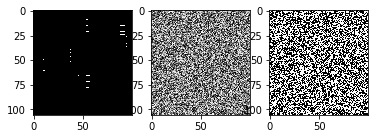

Epoch 3/5:820/1237 loss = 0.40579;


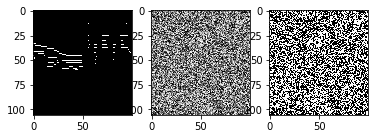

Epoch 3/5:840/1237 loss = 0.450944;


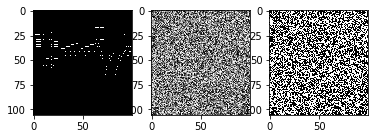

Epoch 3/5:860/1237 loss = 0.646546;


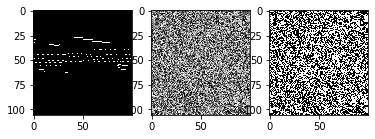

Epoch 3/5:880/1237 loss = 0.481827;


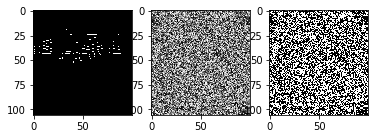

KeyboardInterrupt: ignored

In [84]:
for ep in range(epochs+10):
    for i, (x,y) in enumerate(dataloader):
        #pred, mu, s = net.forward(x)
        pred = net.forward(x)
        #KLD = -0.5 * torch.mean(1 + s - mu.pow(2) - s.exp())
        loss = lossfn(pred,y)
        #loss = general_loss #KLD + general_loss
        adam.zero_grad()
        loss.backward()
        adam.step()
        if i % 20 == 0:
            _,(ax1,ax2,ax3) = plt.subplots(ncols=3)
            print(f"Epoch {ep}/{epochs}:{i}/{len(dataloader)} loss = {np.round(loss.item(),6)};")
                 # kld = {np.round(KLD.item(),6)}; mse = {np.round(general_loss.item(),6)}")
            t1 = ax1.imshow(torch.squeeze(y[-1]),cmap='gray')
            showpred = torch.squeeze(pred[-1]).cpu().detach().numpy()
            showpred = np.uint8(showpred*255)
            t2 = ax2.imshow(showpred,cmap='gray')
            thresh, img = cv2.threshold(showpred,127,255,cv2.THRESH_BINARY)
            t3 = ax3.imshow(img,cmap='gray')
            plt.show()